In [1]:
%matplotlib notebook

<IPython.core.display.Javascript object>


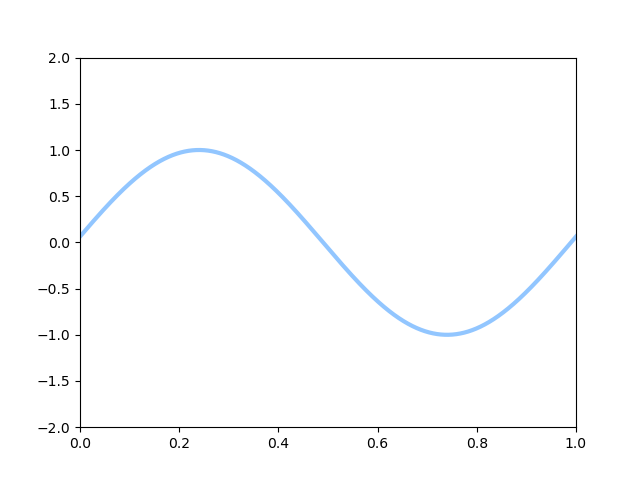

In [2]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython import display as ipd 
plt.style.use('seaborn-pastel')


fig = plt.figure()
ax = plt.axes(xlim=(0, 1), ylim=(-2, 2))
line, = ax.plot([], [], lw=3)

def generate_wave(offset=0, frequency=1, sample_rate=44100):
    x = np.linspace(0, 1, sample_rate)
    y = np.sin(2 * np.pi * (x - 0.01 * offset))
    return x, y
def init():
    line.set_data([], [])
    return line,
def animate(i):
    line.set_data(*generate_wave(i))
    return line,

ani = FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)


from IPython.display import HTML
HTML(ani.to_jshtml())

In equal temperament tuning, each semitone is offset from its neighbors by a factor of 1.0595. This number is derived from the fact there are 12 semitones in an octave, that an octave is double/half the pitch of the root note, and that pitch changes form a geometric series.

<IPython.core.display.Javascript object>


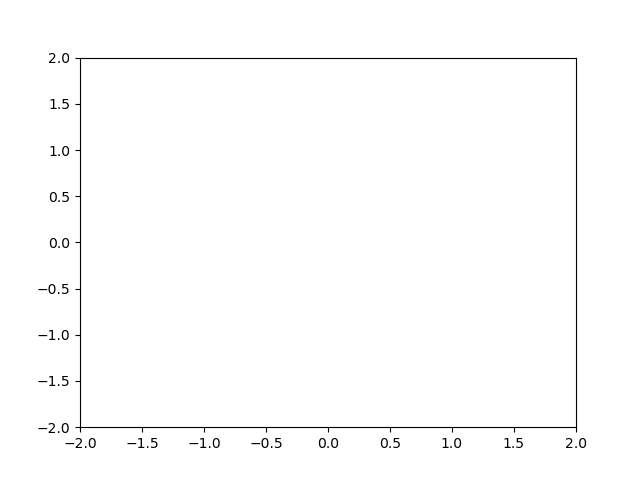

In [3]:
def iterative_wave(frequency=1, sample_rate=200):
    x = np.linspace(0, 1, sample_rate)
    y = np.sin(2 * np.pi * x)
    y2 = np.sin(2 * np.pi * x * (1.0595**7) )
    return y, y2
def it(i=0):
    x, y = iterative_wave()
    return(x[:i+1], y[:i+1])
            

    
def init():
    line.set_data([], [])
    return line,
def animate(i):
    line.set_data(*it(i))
    return line,

fig = plt.figure()
ax = plt.axes(xlim=(-2, 2), ylim=(-2, 2))
line, = ax.plot([], [], lw=3)

ani = FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)

from IPython.display import HTML
HTML(ani.to_jshtml())

#Hello!

Output()

<IPython.core.display.Javascript object>


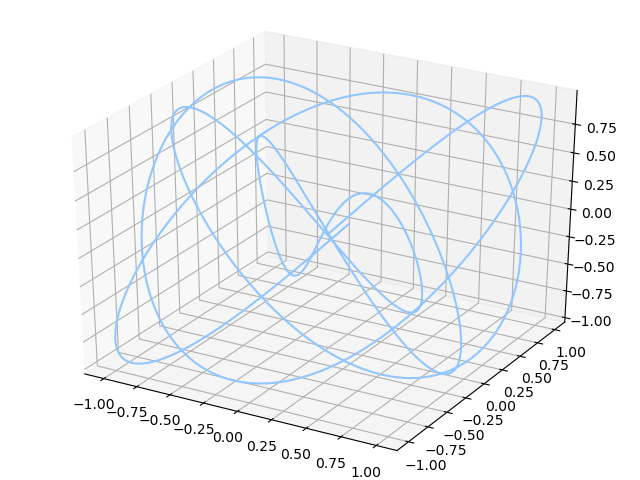

In [19]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

x_note = widgets.IntSlider(value=0, description='First note', max=12, min=0)
y_note = widgets.IntSlider(value=4, description='Second note', max=12, min=0)
z_note = widgets.IntSlider(value=7, description='Third note', max=12, min=0)

form = widgets.HBox([x_note, y_note, z_note])
x_audio = widgets.Output()
y_audio = widgets.Output()
z_audio = widgets.Output()

display(ipd.Markdown('#Hello!'))
display(form)
audio = widgets.HBox([x_audio, y_audio, z_audio])
out = widgets.Output()
with out:
    display(audio)

def generate_audio(wave_array, sr=44100):
    return ipd.Audio(wave_array, rate=sr)

def note_eventhandler(change):
    x, y, z, x_w, y_w, z_w = iterative_wave()
    ax.cla()
    
    out.clear_output(wait=True)
    
    x_audio = widgets.Output()
    y_audio = widgets.Output()
    z_audio = widgets.Output()
    x_audio.append_display_data(ipd.Audio(x_w, rate=44100))
    y_audio.append_display_data(ipd.Audio(y_w, rate=44100))
    z_audio.append_display_data(ipd.Audio(z_w, rate=44100))
    audio = widgets.HBox([x_audio, y_audio, z_audio])
    chord = ipd.Audio(x_w + y_w + z_w, rate=44100)
    chord_audio = widgets.Output()
    chord_audio.append_display_data(chord)
    with out:
        display(audio)
        print("The chord!")
        display(chord)
        ax.plot(x, y, z)
    
x_note.observe(note_eventhandler, names='value')
y_note.observe(note_eventhandler, names='value')
z_note.observe(note_eventhandler, names='value')

def visual_wave(interval):
    t = np.linspace(0, 4, 44100)
    return np.sin(2 * np.pi * t * (1.0595**interval))
    
def audio_wave(interval):
    t = np.linspace(0, 4, 44100)
    return np.sin(0.25 * np.pi * t * 440 * (1.0595**interval))

def iterative_wave():
    root = x_note.value
    third = y_note.value
    fifth = z_note.value
    x, y, z = list(map(visual_wave, [root, third, fifth]))
    x_audio, y_audio, z_audio = list(map(audio_wave, [root, third, fifth]))
    return x, y, z, x_audio, y_audio, z_audio

x, y, z, x_w, y_w, z_w = iterative_wave()

display(out)
fig = plt.figure()
fig.set_label('Chord visualization')
ax = Axes3D(fig)
ax.plot(x, y, z)
